# Multimodal Deep Learning: Visual–Textual Entailment

This project demonstrates multimodal reasoning by combining visual and textual information using DenseNet and BERT.  
It was originally developed as part of an academic research assignment within the Master of Data Science program at RMIT University and is shared here to illustrate practical deep learning and model evaluation skills using open data.



# 1. Problem Statement

The objective of this task is to design and evaluate a deep learning system for **visual-textual entailment**. 

Given an **image** and a piece of **hypothesis text**, the model will classify the relationship into one of two categories:
- **Entailment** – the hypothesis is supported by the image.
- **Contradiction** – the hypothesis conflicts with the image.

The dataset contains approximately **39k samples** of hypothesis text linked to more than **19k images**, adapted from the **SNLI-VE** corpus for binary classification. 

The task requires building a **multimodal deep learning model**, which is capable of understanding both **visual** and **linguistic** information and then reason about their semantic relationship.

The goal is to achieve the **best possible accuracy** within these resource and data limitations, supported by clear justification and critical analysis.


# 2. Data Overview and Exploration

Firstly, we set up the notebook and load required packages.

In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["XLA_FLAGS"] = "--xla_gpu_cuda_data_dir=" 
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)
import tensorflow as tf
tf.get_logger().setLevel('ERROR')

import pandas as pd
import json
import matplotlib.pyplot as plt
import os
from PIL import Image
from collections import Counter
from tqdm import tqdm
import textwrap
import nltk
nltk.download('stopwords')
from collections import Counter
import re
from nltk.corpus import stopwords
import random
from sklearn.model_selection import train_test_split

!pip install -q keras-hub tensorflow-text==2.16.1
!pip install -q keras-cv --upgrade
import keras_hub
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import DenseNet121
import keras_cv
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, CSVLogger, ModelCheckpoint
import cv2
import seaborn as sns
from keras_hub.tokenizers import BertTokenizer
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


  DEPRECATION: Building 'promise' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'promise'. Discussion can be found at https://github.com/pypa/pip/issues/6334
Using TensorFlow backend


## 2.1 Text Data 

The text data is stored in **JSON Lines (.jsonl)** format.  
We load these records into a **Pandas DataFrame** for easier inspection and analysis.

In [2]:
jsonl_file = "A2_data/A2_train_v3.jsonl"

records = [json.loads(line) for line in open(jsonl_file, "r")]

df = pd.DataFrame(records, columns=["Image_ID", "Hypothesis", "Label"])

print(df.head())
print(df.shape)

     Image_ID                                       Hypothesis          Label
0  4564320256              The old woman and a girl are bored.     entailment
1  4564320256         Two old men robbing a convenience store.  contradiction
2  4564320256            A man implies that he is very strong.  contradiction
3  3945005060  People rubbing sticks to start a fire in a pit.  contradiction
4   369186134                         Dogs are out in the snow     entailment
(39129, 3)


Each record contains:
- `Image_ID`: the unique identifier of the image.  
- `Hypothesis`: a short English statement.  
- `Label`: either *entailment* or *contradiction*.

After loading, the dataset contains **39,129** rows of hypothesis.

Next, we inspect the class balance on the label of the whole dataset.

In [3]:
df["Label"].value_counts()

Label
entailment       19619
contradiction    19510
Name: count, dtype: int64

As we can see, the dataset is **well-balanced** (difference < 1%) across the two target classes. This means we don’t need to apply class weighting, resampling, or focal loss for imbalance correction, as long as our later splits not breaking this balance.

Next, let us check the unique values for both the text and image ID. 

In [4]:
print("Number of unique hypothesis: ", df["Hypothesis"].nunique())
print("Number of unique image: ", df["Image_ID"].nunique())

Number of unique hypothesis:  36745
Number of unique image:  19573


We can see that hypothesises outnumber images.To better understand this relationship, we examine how many hypotheses are associated with each image.

In [5]:
df.groupby("Image_ID").size().describe()

count    19573.000000
mean         1.999131
std          0.814711
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          3.000000
dtype: float64

The result shows images have one to three hypothesises linked with them. The numbers on these three groups are close. 
This reassures us that there are **no extreme cases** where small number of images are linked to large number of hypotheses.  

Next, we examine the **length of each hypothesis sentence**.


count    39129.000000
mean         6.935291
std          2.732952
min          1.000000
25%          5.000000
50%          6.000000
75%          8.000000
max         35.000000
Name: hypo_len, dtype: float64


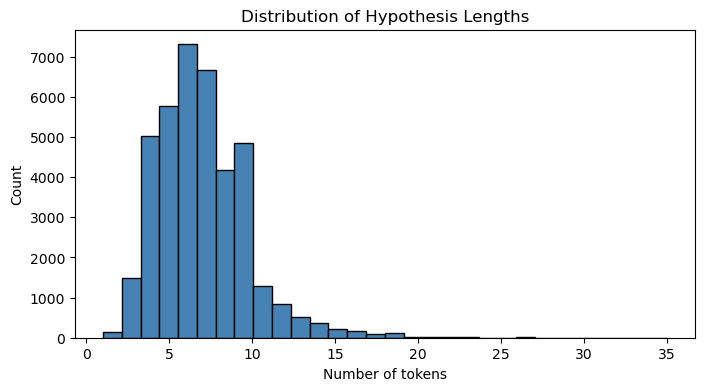

In [6]:
df["hypo_len"] = df["Hypothesis"].apply(lambda x: len(x.split()))

print(df["hypo_len"].describe())

# plot histogram
plt.figure(figsize=(8,4))
plt.hist(df["hypo_len"], bins=30, color="steelblue", edgecolor="black")
plt.title("Distribution of Hypothesis Lengths")
plt.xlabel("Number of tokens")
plt.ylabel("Count")
plt.show()

Most hypotheses contain **5–8 words**, while only a few exceed 15 tokens.  
The distribution has a long tail, and numbers are very low after 20. 
Our earlier decision would be a **maximum sequence length of around 20 tokens** is sufficient for model input without significant truncation loss. But let us further investigate the more than 20 length one.

In [7]:
long_hypo = df[df["hypo_len"] > 20]

print("Number of hypotheses with more than 20 tokens:", len(long_hypo))
print("Proportion:", len(long_hypo) / len(df))

print("\nSample of long hypotheses:\n")
for i, row in long_hypo.sample(5, random_state=110).iterrows():
    print(f"- ({row['hypo_len']} tokens) {row['Hypothesis']}\n")

Number of hypotheses with more than 20 tokens: 82
Proportion: 0.0020956323954100537

Sample of long hypotheses:

- (21 tokens) A priest is holding a cross in a Church with children with a girl next to him in a nun's habit.

- (24 tokens) Some boys, one in a white tank top and the other in a striped shirt, are in an area that looks like a dump.

- (24 tokens) During a baseball game, a man flies to 5th base, going over the head of an opponent to the chagrin of an onlooking woman.

- (26 tokens) two ladies are getting their photo taken by a woman in a dark hoodie while a woman in a dark coat stands holding purses and observes.

- (28 tokens) A group of men in camouflage uniforms do push-ups on an athletic field while runners in black and blue tank tops and shorts traverse the track behind them.



Since over 99% of hypotheses are under 20 tokens and more than 75% less than 10 tokens, plus the longer ones seems to add more details rather than new semantic information at the end of their statements, using a **maximum sequence length of 20** can minimise the unnecessary padding and improves training efficiency without losing much meaningful information.


Since there are multiple hypothesises linked to one image, we lastly need to make sure the image-hypothesis to label is unique and not contradicted on labelling. 

In [8]:
duplicates = df.duplicated(subset=["Image_ID", "Hypothesis", "Label"]).sum()
print("Exact duplicate records:", duplicates)

conflicts = (
    df.groupby(["Image_ID", "Hypothesis"])["Label"]
    .nunique()
    .reset_index(name="unique_labels")
)
conflicts = conflicts[conflicts["unique_labels"] > 1]
print("Conflicting label pairs:", len(conflicts))

Exact duplicate records: 7
Conflicting label pairs: 0


So it is good that there is no conflicting label pairs found. But there are couple duplicates in the **Image_ID, Hypothesis, Label** combinations due to an extra column/key in the original dataset. We can just remove the duplicates.

In [9]:
df = df.drop_duplicates(subset=["Image_ID", "Hypothesis", "Label"]).reset_index(drop=True)

print("Duplicates removed successfully.")
print("Current dataset size:", len(df))

Duplicates removed successfully.
Current dataset size: 39122


Now, we have our final number of hypothesis which is **39,122**. 
Lastly, we have an overview of what contents are in the hypothesises. Since most of the statements are very short, we can just simply do a **word frequency** run.

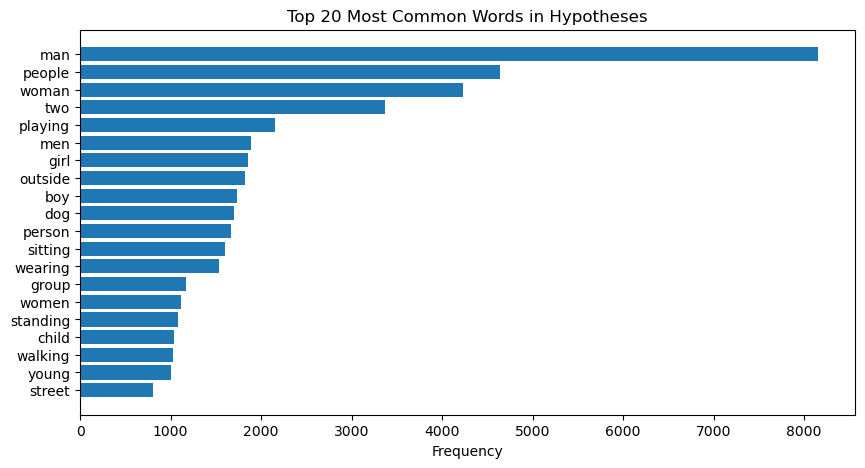

In [10]:
stop_words = set(stopwords.words("english"))
tokens = []

for text in df["Hypothesis"]:
    words = re.findall(r"\b\w+\b", text.lower())
    tokens.extend([w for w in words if w not in stop_words])

common_words = Counter(tokens).most_common(20)
words, counts = zip(*common_words)
plt.figure(figsize=(10,5))
plt.barh(words[::-1], counts[::-1])
plt.xlabel("Frequency")
plt.title("Top 20 Most Common Words in Hypotheses")
plt.show()

The most frequent words in the hypotheses include **“man,” “people,” “woman,” “playing,” “outside,” “dog,”** and **“child.”**  
These terms suggest that the dataset primarily features **human–object interactions and everyday activities**, such as playing, sitting, standing, or walking.

## 2.2 Image Data

The visual component of the dataset contains **19,573 unique images**.

In this section, we will explore these images. Let us start by checking the **image dimension**.

In [11]:
IMG_DIR = "A2_data/A2_Images"

size_counts = Counter()

for img_id in tqdm(df["Image_ID"].unique()):
    path = os.path.join(IMG_DIR, f"{img_id}.jpg")
    if os.path.exists(path):
        with Image.open(path) as im:
            size_counts[im.size] += 1   # im.size = (width, height)

# convert to DataFrame for analysis
size_df = pd.DataFrame(size_counts.items(), columns=["size", "count"])
size_df = size_df.sort_values("count", ascending=False).reset_index(drop=True)

print(size_df.head(20))   # top 20 most common sizes
print(f"\nUnique sizes: {len(size_df)}")

100%|██████████| 19573/19573 [00:15<00:00, 1247.82it/s]

          size  count
0   (500, 333)   3918
1   (500, 375)   3881
2   (333, 500)   1594
3   (375, 500)   1453
4   (500, 334)    898
5   (500, 332)    771
6   (500, 500)    339
7   (332, 500)    309
8   (334, 500)    294
9   (500, 335)    238
10  (500, 400)    212
11  (500, 281)    186
12  (500, 331)    141
13  (500, 357)    117
14  (400, 500)    103
15  (335, 500)     92
16  (500, 374)     79
17  (357, 500)     78
18  (500, 376)     57
19  (500, 336)     56

Unique sizes: 669


We can see there are various sizes of the images. The most common dimensions are concentrated around **(500, 333)** and **(500, 375)**, accounting for more than half of the data.

Most images follow a **3:2 aspect ratio**, either in landscape or portrait orientation. 

We will **resize all images to a fixed resolution** (224×224) to ensure uniform input for the transfer learning backbone.


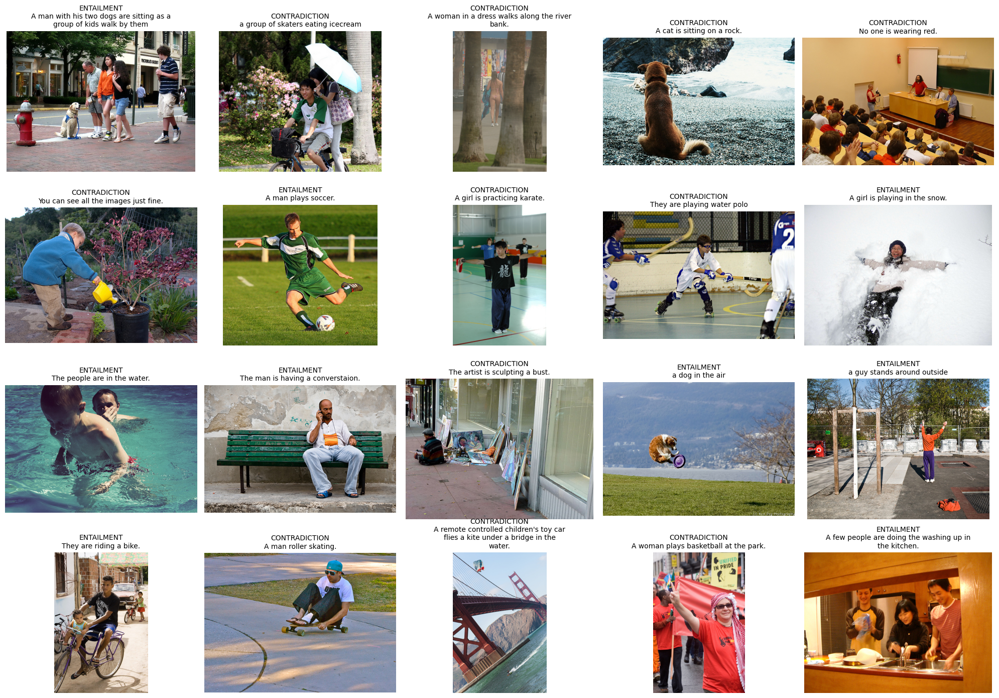

In [ ]:
sample_df = df.sample(20, random_state=110).reset_index(drop=True)

fig, axes = plt.subplots(4, 5, figsize=(20, 14))
axes = axes.flatten()

for ax, (_, row) in zip(axes, sample_df.iterrows()):
    img_path = os.path.join("A2_data", "A2_Images", f"{row.Image_ID}.jpg")
    if os.path.exists(img_path):
        img = Image.open(img_path)
        ax.imshow(img)
        title_text = f"{row.Label.upper()}\n" + "\n".join(textwrap.wrap(row.Hypothesis, 40))
        ax.set_title(title_text, fontsize=10)
        ax.axis("off")
    else:
        ax.text(0.5, 0.5, "Not found", ha="center", va="center", fontsize=9)
        ax.axis("off")

plt.tight_layout()
plt.show()

Random samples show a **diverse range of real-world scenes**, including **human interactions with objects, animals, and environments** — such as playing sports, performing daily activities, and engaging in outdoor or indoor actions.   

This will require our model to be able to learn actions, objects, and context in images. The **action recognition** in the image related to the **verb** in the text may be a big challenge in here, since we only have the still image. 

## 2.3 Our Goal
Since the dataset is balanced across the two classes,
accuracy can represent overall performance fairly, but macro-F1 is also monitored to identify possible
imbalance between classes.

Given the moderate dataset size (~39k text–image pairs from only 19k unique images) 
and the complexity of visual–textual reasoning from single still images, we will set our target 
as **≥ 0.70 accuracy (macro-F1 ≈ 0.70)** on the unseen test set. 


# 3. Data Preparation

Before building the model, we first split the dataset.

## 3.1 Data Splitting

Since the same image can appear with multiple hypotheses, we perform the split **based on `Image_ID`** to avoid the same image from appearing in different sets.

We divide the dataset into:
- **Training set:** 70% of images  
- **Validation set:** 20% of images  
- **Test set:** 10% of images  


In [13]:
# encode labels (entailment=1, contradiction=0)
df["label_id"] = df["Label"].map({"entailment": 1, "contradiction": 0})

# unique images
unique_ids = df["Image_ID"].unique()

# first split: train (70%) and temp (30%)
train_ids, temp_ids = train_test_split(
    unique_ids, test_size=0.3, random_state=110, shuffle=True
)

# second split: val (20%) and test (10%)
val_ids, test_ids = train_test_split(
    temp_ids, test_size=1/3, random_state=110, shuffle=True
)

# assign split
def get_split(x):
    if x in train_ids:
        return "train"
    elif x in val_ids:
        return "val"
    else:
        return "test"

df["split"] = df["Image_ID"].apply(get_split)

# make separate dfs
train_df = df[df["split"]=="train"].reset_index(drop=True)
val_df   = df[df["split"]=="val"].reset_index(drop=True)
test_df  = df[df["split"]=="test"].reset_index(drop=True)

print(train_df.shape, val_df.shape, test_df.shape)
print(train_df["label_id"].value_counts())
print(val_df["label_id"].value_counts())
print(test_df["label_id"].value_counts())


(27378, 6) (7812, 6) (3932, 6)
label_id
1    13715
0    13663
Name: count, dtype: int64
label_id
1    3951
0    3861
Name: count, dtype: int64
label_id
0    1985
1    1947
Name: count, dtype: int64


After the splits, all three subsets maintain a **balanced label distribution** (difference less than 2%) between entailment and contradiction counts.  

## 3.2 Data Preprocessing

In our task, we will use transfer learning. Before training, both image and text inputs are preprocessed to match the expected input formats of their respective pretrained backbones.

#### Model Backbones Used
- **Image Encoder:** considering both **performance** and **computational efficiency**, we choose `DenseNet121`.  
- **Text Encoder:** we choose `bert_en_uncased` for its proven ability to capture **contextual and semantic meaning** in short sentences.

These two models balance **performance and computational cost**, making them ideal for the our multimodal setup.

#### Text Preprocessing
We will use the **BERT preprocessor** from KerasHub to tokenize and encode each hypothesis.  
The sequence length is fixed at **20 tokens**, based on our earlier EDA findings.


In [14]:
preprocessor = keras_hub.models.BertPreprocessor.from_preset("bert_base_en_uncased", 
                                                            sequence_length=20)

100%|██████████| 457/457 [00:00<00:00, 1.13MB/s]


100%|██████████| 761/761 [00:00<00:00, 1.62MB/s]


100%|██████████| 226k/226k [00:01<00:00, 198kB/s]


#### Image Preprocessing

Each image is read from the dataset directory and resized to **224×224** pixels to meet the input requirement of DenseNet121.  
Pixel values are converted to floating-point tensors and normalised using the **DenseNet121 preprocessing function**.  

In [15]:
IMG_DIR = "A2_data/A2_Images"
IMG_SIZE = (224, 224)   # DenseNet121 standard

def load_image(image_id):
    path = tf.strings.join([IMG_DIR, "/", image_id, ".jpg"])
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    img = densenet_preprocess(img)  # DenseNet121 preprocessing
    return img


#### TensorFlow Dataset Construction

A `tf.data` pipeline is created to prepare and feed data to the model.
Functions are created to load and process the image, tokenizes the hypothesis, and bundles them into a structured feature dictionary. Each sample combines both **image** and **text** features. We construct three datasets for training, evaluation and testing.

In [16]:
def make_example(image_id, text, label):
    img = load_image(image_id)
    tokens = preprocessor(text)
    features = {
        "image": tf.cast(img, tf.float32),
        "token_ids": tf.cast(tokens["token_ids"], tf.int32),
        "segment_ids": tf.cast(tokens["segment_ids"], tf.int32),
        "padding_mask": tf.cast(tokens["padding_mask"], tf.int32)
    }
    return features, tf.cast(label, tf.float32)

def make_dataset(df, batch_size=32, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices(
        (df["Image_ID"].values, df["Hypothesis"].values, df["label_id"].astype("int32").values)
    )
    if shuffle:
        ds = ds.shuffle(buffer_size=len(df), seed=42)
    ds = ds.map(lambda img_id, text, lbl: make_example(img_id, text, lbl),
                num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_dataset(train_df, batch_size=32, shuffle=True)
val_ds   = make_dataset(val_df, batch_size=32, shuffle=False)
test_ds  = make_dataset(test_df, batch_size=32, shuffle=False)


# 4. Model Building

Now we can start building our multimodal model. We will start from the basic and gradually increasing model capacity based on the performance observed. Let us create two functions which can be used for the model results and evaluation first.

In [45]:
def plot_history(history, title_prefix=""):
    """Plot training and validation accuracy and loss curves."""
    plt.figure(figsize=(10, 4))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Accuracy")
    plt.plot(history.history["val_accuracy"], label="Val Accuracy")
    plt.title(f"{title_prefix} Accuracy over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title(f"{title_prefix} Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Binary Crossentropy Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [46]:
def evaluate_on_test(model, test_ds, model_name="Model"):
    """Evaluate model on the test set and print key metrics."""
    print(f"\n--- Evaluating {model_name} ---")
    
    # Evaluate overall loss and accuracy
    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    print(f"{model_name} Test Accuracy: {test_acc:.4f}")
    print(f"{model_name} Test Loss: {test_loss:.4f}")

    # Collect predictions and true labels
    y_true = np.concatenate([y for _, y in test_ds], axis=0)
    y_pred_probs = model.predict(test_ds, verbose=0)
    y_pred = (y_pred_probs > 0.5).astype(int).ravel()

    # Classification report
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=["Contradiction", "Entailment"], digits=4))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    print("\nConfusion Matrix:")
    print(cm)
    
    return {"loss": test_loss, "accuracy": test_acc, "confusion_matrix": cm}



### 4.1 Baseline Model — Frozen Backbones (Head Training Only)

In this initial version, both pretrained backbones are **frozen**, we are focusing training on the **fusion and classification head**.

- **Image Encoder:** DenseNet121 (ImageNet pretrained, frozen).  
- **Text Encoder:** BERT base (frozen).  
- **Fusion Layer:** Concatenation of visual and textual embeddings.  
- **Classification Head:** Two fully connected layers with dropout, followed by a sigmoid output for binary classification.

In [47]:
# --- Image Encoder (Frozen) ---
img_input = layers.Input(shape=(224, 224, 3), name="image")
base_cnn = tf.keras.applications.DenseNet121(
    include_top=False, weights="imagenet", pooling="avg"
)
base_cnn.trainable = False
img_features = base_cnn(img_input)

# --- Text Encoder (Frozen) ---
text_input_ids = layers.Input(shape=(None,), dtype=tf.int32, name="token_ids")
text_segment_ids = layers.Input(shape=(None,), dtype=tf.int32, name="segment_ids")
text_padding_mask = layers.Input(shape=(None,), dtype=tf.int32, name="padding_mask")

bert_encoder = keras_hub.models.BertBackbone.from_preset("bert_base_en_uncased")
bert_encoder.trainable = False

text_features = bert_encoder(
    {
        "token_ids": text_input_ids,
        "segment_ids": text_segment_ids,
        "padding_mask": text_padding_mask,
    }
)["pooled_output"]

# --- Fusion + Classification Head ---
fusion = layers.Concatenate()([img_features, text_features])
x = layers.Dense(512, activation="relu")(fusion)
x = layers.Dropout(0.4)(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.3)(x)
output = layers.Dense(1, activation="sigmoid")(x)

# --- Build Model ---
densenet_bert_v1 = Model(
    inputs={
        "image": img_input,
        "token_ids": text_input_ids,
        "segment_ids": text_segment_ids,
        "padding_mask": text_padding_mask,
    },
    outputs=output,
)

# --- Compile ---
densenet_bert_v1.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)


total_params = densenet_bert_v1.count_params()
trainable_params = sum(tf.size(v).numpy() for v in densenet_bert_v1.trainable_weights)
non_trainable_params = total_params - trainable_params

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Non-trainable parameters: {non_trainable_params:,}")

Total parameters: 8,021,313
Trainable parameters: 983,809
Non-trainable parameters: 7,037,504


We see that most of parameters are frozen. Trainable parameters are only 983k for the heads we added. Now, let us train the first model. 

In [48]:
EPOCHS = 15

history_v1 = densenet_bert_v1.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    verbose=0
)


### Baseline (v1) Training Results

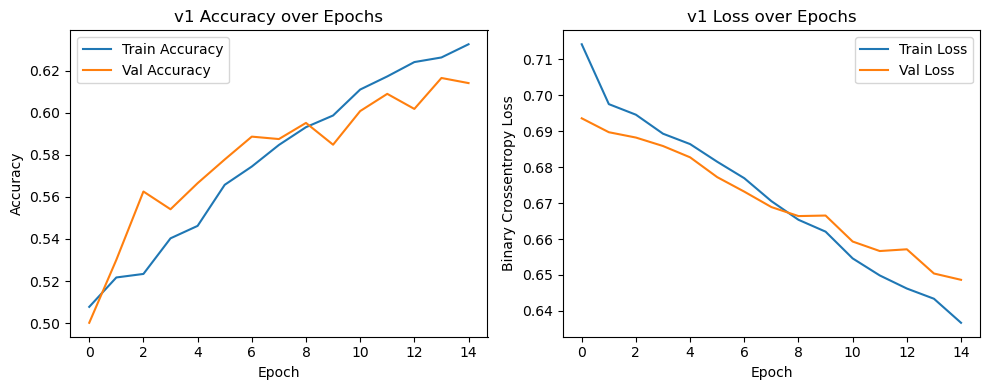

In [49]:
plot_history(history_v1, title_prefix="v1")

After training for 15 epochs, the baseline model shows steady and consistent learning:

- **Training accuracy:** ~0.62  
- **Validation accuracy:** ~0.61  
- **Training and validation loss:** both continue to decline smoothly.

These results showed that even just with the frozen backbones and a simple fusion head, model can already learn meaningful multimodal patterns.  
### Model v1 Test Results

In [50]:
results_v1 = evaluate_on_test(densenet_bert_v1, test_ds, model_name="v1 densenet_bert_frozen")


--- Evaluating v1 densenet_bert_frozen ---
v1 densenet_bert_frozen Test Accuracy: 0.6211
v1 densenet_bert_frozen Test Loss: 0.6478
123/123 [==============================] - 41s 139ms/step

Classification Report:
               precision    recall  f1-score   support

Contradiction     0.6563    0.5234    0.5824      1985
   Entailment     0.5973    0.7206    0.6532      1947

     accuracy                         0.6211      3932
    macro avg     0.6268    0.6220    0.6178      3932
 weighted avg     0.6271    0.6211    0.6174      3932


Confusion Matrix:
[[1039  946]
 [ 544 1403]]


The baseline model (v1) achieves **62.1% test accuracy**.

- **Entailment recall (0.72)** is much higher than **Contradiction recall (0.52)**, meaning the model tends to favor “entailment” predictions.  
- Overall F1 = 0.62 aligns with expectations for a non-fine-tuned multimodal model.

For the next step, we will extend this model's structure.

## 4.2 Model v2 — Cross-Attention Fusion and Partial Fine-Tuning

Based on the baseline (v1), for the v2 model, we will do the following enhancements to improve multimodal interaction and generalisation.  

### 1) Cross-Attention Fusion
In v1, the image and text embeddings were simply concatenated. This might have limited the interaction between the two parts.  
Thus, in Model v2, we introduce a **Cross-Attention layer** where image and text features attend to each other before fusion.  

### 2) Partial Fine-Tuning
In model v2, we unfreeze **DenseNet conv5** block and **last two layers of BERT**, while keeping the lower layers frozen.

### 3) Stronger Image Augmentation
Since our image dataset (~19k images) is relatively small, we apply augmentations such as **RandomFlip**, **Rotation**, **Zoom**, **Contrast**, and **Cutout**.  
Hopefully this will increases data diversity, helping the model generalisation.

### 4) Regularisation Enhancements
We add **L2 weight regularisation** and **Dropout (0.5)** in the classification head, aiming to stabilises optimisation and improves generalisation.

### 5) Optimiser and Loss Adjustment
We use **AdamW (lr=1e-5, weight_decay=1e-4)** and **label smoothing (0.05)** in binary cross-entropy to reduce overconfidence.

In [51]:
# --- Cross-Attention Layer ---
class CrossAttention(layers.Layer):
    def __init__(self, embed_dim, num_heads=4, **kwargs):
        super().__init__(**kwargs)
        self.mha = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dtype="float32"
        )
        self.norm = layers.LayerNormalization(epsilon=1e-6, dtype="float32")

    def call(self, query, key_value, training=False):
        query = tf.cast(query, tf.float32)
        key_value = tf.cast(key_value, tf.float32)
        attn_output = self.mha(query=query, value=key_value, key=key_value, training=training)
        return self.norm(query + attn_output)

# --- IMAGE ENCODER ---
image_input = layers.Input(shape=(224,224,3), name="image")

# Stronger augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    keras_cv.layers.RandomCutout(height_factor=0.2, width_factor=0.2)
], name="augmentation")

aug_img = data_augmentation(image_input)

base_cnn = DenseNet121(weights="imagenet", include_top=False, pooling="avg")
base_cnn.trainable = False
for l in base_cnn.layers:
    if not isinstance(l, tf.keras.layers.BatchNormalization):
        if l.name.startswith("conv5"):
            l.trainable = True

img_features = base_cnn(aug_img)

reg = tf.keras.regularizers.l2(1e-4)

proj_img = layers.Dense(256, activation="relu", kernel_regularizer=reg, dtype="float32")(img_features)
proj_img = layers.LayerNormalization(epsilon=1e-6, dtype="float32")(proj_img)
proj_img = layers.Reshape((1, 256))(proj_img)  # sequence length 1

# --- TEXT ENCODER (BERT) ---
tok_ids = layers.Input(shape=(None,), dtype="int32", name="token_ids")
seg_ids = layers.Input(shape=(None,), dtype="int32", name="segment_ids")
pad_mask = layers.Input(shape=(None,), dtype="int32", name="padding_mask")

bert = keras_hub.models.BertBackbone.from_preset("bert_base_en_uncased")
bert.trainable = False
for layer in bert.layers[-2:]:   # fine-tune last 2 layers only
    layer.trainable = True

text_out = bert({
    "token_ids": tok_ids,
    "segment_ids": seg_ids,
    "padding_mask": pad_mask
})

txt_features = tf.cast(text_out["sequence_output"], tf.float32)  
pooled_txt  = tf.cast(text_out["pooled_output"], tf.float32)

# --- Project text sequence to 256-dim before attention ---
proj_txt_seq = layers.Dense(256, activation=None, kernel_regularizer=reg, dtype="float32")(txt_features)

# --- CROSS-ATTENTION FUSION ---
cross1 = CrossAttention(embed_dim=256, num_heads=4)(proj_txt_seq, proj_img)
cross2 = CrossAttention(embed_dim=256, num_heads=4)(proj_img, proj_txt_seq)

cross1_pooled = layers.GlobalAveragePooling1D()(cross1)
cross2_flat   = layers.Flatten()(cross2)

fused = layers.Concatenate()([cross1_pooled, cross2_flat, pooled_txt])

# --- Classification head ---
x = layers.Dense(256, activation="relu", kernel_regularizer=reg, dtype="float32")(fused)
x = layers.Dropout(0.5)(x)  # stronger dropout
output = layers.Dense(1, activation="sigmoid", dtype="float32")(x)

# --- MODEL ---
densenet_crossattn_v2 = Model(
    inputs=[image_input, tok_ids, seg_ids, pad_mask],
    outputs=output
)

# Compile with AdamW + label smoothing
densenet_crossattn_v2.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-5, weight_decay=1e-4),
    loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.05),
    metrics=["accuracy"]
)

# Display total, trainable, and non-trainable parameter counts for Model v2
total_params = densenet_crossattn_v2.count_params()
trainable_params = sum(tf.size(v).numpy() for v in densenet_crossattn_v2.trainable_weights)
non_trainable_params = total_params - trainable_params

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Non-trainable parameters: {non_trainable_params:,}")

Total parameters: 9,930,305
Trainable parameters: 2,892,801
Non-trainable parameters: 7,037,504


After the unfreezing, now we have **2.8+ millions** trainable parameters. 

### 6) Training Configuration

To ensure stable and efficient training for Model v2, several **callbacks** are defined:

- **EarlyStopping:** Monitors validation accuracy and stops training when no improvement for 3 epochs.  
- **ReduceLROnPlateau:** Reduces the learning rate by half if validation loss plateaus for 2 epochs, better optimisation in later stage.  
- **CSVLogger:** Records training metrics (accuracy, loss) to a CSV file.  
- **ModelCheckpoint:** Saves the model weights whenever validation accuracy improves.

In [52]:
# --- Callbacks ---
early_stop = EarlyStopping(
    monitor="val_accuracy",
    mode="max",
    patience=3,
    restore_best_weights=True,
    verbose=1
)

lr_scheduler = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    min_lr=1e-7,
    verbose=1
)

csv_logger = CSVLogger("training_log_v2.csv", append=True)

checkpoint = ModelCheckpoint(
    "best_densenet_crossattn_v2.weights.h5",
    monitor="val_accuracy",
    save_best_only=True,
    save_weights_only=True,   
    mode="max",
    verbose=0
)

# --- Train ---
history_v2 = densenet_crossattn_v2.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    callbacks=[early_stop, lr_scheduler, csv_logger, checkpoint],
    verbose=0
)

Restoring model weights from the end of the best epoch: 14.


### Model v2 Training Results

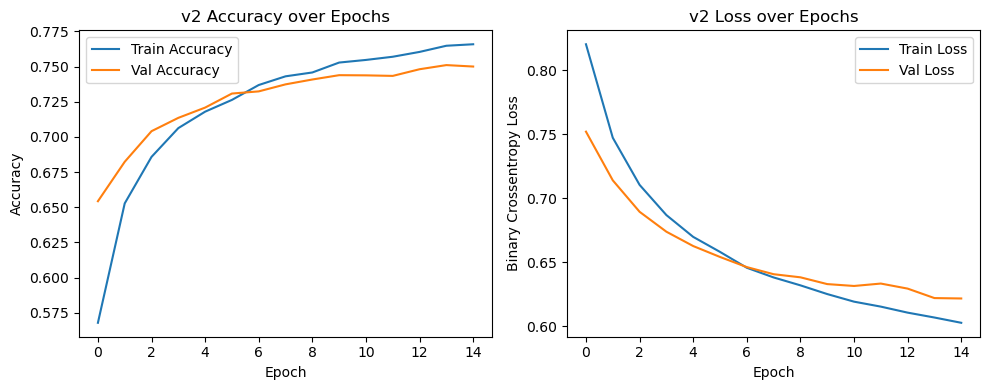

In [53]:
plot_history(history_v2, title_prefix="v2")

Model v2 achieves a clear and consistent improvement from the baseline:

- **Validation accuracy:** rises to approximately **0.75**, a +13% gain from v1.  
- **Training and validation losses:** both decrease smoothly.  
- **Training–validation gap:** remains small.

The improvement shows that **cross-attention fusion** and **partial fine-tuning** significantly strengthen the model’s ability to this task.

### Model v2 Test Results

In [54]:
results_v2 = evaluate_on_test(densenet_crossattn_v2, test_ds, model_name="v2 Cross-Attention")


--- Evaluating v2 Cross-Attention ---
v2 Cross-Attention Test Accuracy: 0.7513
v2 Cross-Attention Test Loss: 0.6165
123/123 [==============================] - 42s 142ms/step

Classification Report:
               precision    recall  f1-score   support

Contradiction     0.7648    0.7305    0.7472      1985
   Entailment     0.7372    0.7709    0.7537      1947

     accuracy                         0.7505      3932
    macro avg     0.7510    0.7507    0.7505      3932
 weighted avg     0.7511    0.7505    0.7504      3932


Confusion Matrix:
[[1450  535]
 [ 446 1501]]


Model v2 has gained big improvement from v1, achieved **75.1% test accuracy** and balanced performance across both classes.

- **Precision and recall** are closely matched between *Contradiction* and *Entailment*, which is also improved from v1.  
- The **confusion matrix** does not show any systematical misclassifications.


## 4.3 Model v3 — Further Fine-Tuning of conv4 and conv5
While Model v2 improved performance, the CNN backbone was only trained on the last block. Based on the model v2, we will try to 
extend by further unfreezing the **`conv4` and `conv5` blocks** of DenseNet121. This is to see if we can have more gains in the image part. 
What we will do for v3 are:
- **Unfreeze `conv4` and `conv5`**.  
- **Keep last two BERT layers trainable**.  
- **Reduce learning rate to 1e-6** and **increase label smoothing to 0.1**.  
- **Initialise from best v2 weights**.

In [55]:
# --- Load best weights from v2 as initialisation ---
densenet_crossattn_v2.load_weights("best_densenet_crossattn_v2.weights.h5")

# --- Unfreeze conv4 and conv5 blocks for fine-tuning ---
for l in base_cnn.layers:
    if not isinstance(l, tf.keras.layers.BatchNormalization):
        if l.name.startswith(("conv4", "conv5")):
            l.trainable = True

# --- Compile as new v3 model ---
densenet_crossattn_v3 = densenet_crossattn_v2
densenet_crossattn_v3.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-6, weight_decay=1e-4),
    loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),
    metrics=["accuracy"]
)

# --- Callbacks ---
callbacks = [
    EarlyStopping(monitor="val_accuracy", mode="max", patience=3, restore_best_weights=True, verbose=0),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-7, verbose=0),
    ModelCheckpoint("best_densenet_crossattn_v3.weights.h5", monitor="val_accuracy",
                    save_best_only=True, save_weights_only=True, mode="max", verbose=0),
    CSVLogger("training_log_v3.csv", append=True)
]

# --- Fine-tuning training ---
history_v3 = densenet_crossattn_v3.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5,
    callbacks=callbacks, 
    verbose=0
)


### Model v3 Training Results

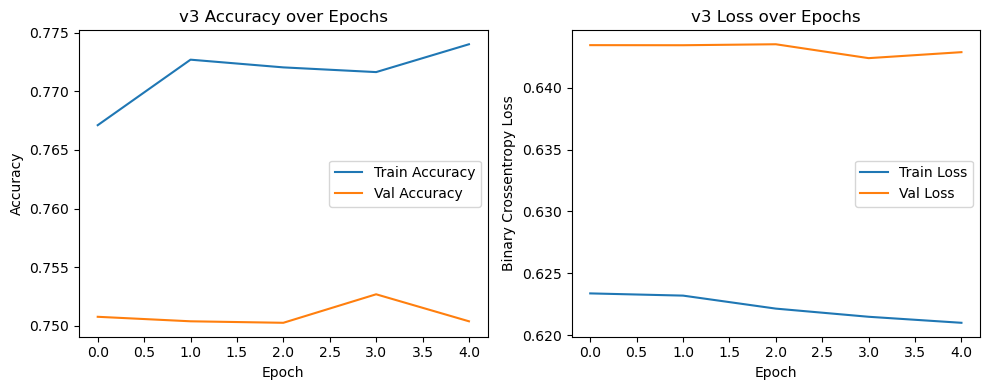

In [56]:
plot_history(history_v3, title_prefix="v3")

Model v3 shows stable convergence after extending fine-tuning to both **conv4** and **conv5** layers:

- **Validation accuracy:** remains above **0.75**, slightly better than v2 performance.  
- **Training accuracy:** slightly increases over ~0.77, but with minimal gap to validation accuracy.  
- **Loss curves:** remain stable and tiny decrease.

The limited improvement indicates that most transferable visual–text alignment capability was well captured in v2, but this further training could be bringing in a bit more stability. This also indicates that the current architecture might have hit its ceiling. 
### Model v3 Test Results

In [57]:
results_v3 = evaluate_on_test(densenet_crossattn_v3, test_ds, model_name="v3 Cross-Attention")


--- Evaluating v3 Cross-Attention ---
v3 Cross-Attention Test Accuracy: 0.7541
v3 Cross-Attention Test Loss: 0.6371
123/123 [==============================] - 43s 142ms/step

Classification Report:
               precision    recall  f1-score   support

Contradiction     0.7666    0.7345    0.7502      1985
   Entailment     0.7404    0.7720    0.7558      1947

     accuracy                         0.7531      3932
    macro avg     0.7535    0.7532    0.7530      3932
 weighted avg     0.7536    0.7531    0.7530      3932


Confusion Matrix:
[[1458  527]
 [ 444 1503]]


Model v3 achieves a **test accuracy of 75.3%**, showing a tiny improvement over v2 (75.0%).  

- **Precision, recall, and F1-scores** are very close across both classes.  
- The **confusion matrix** shows no systematical bias.  

Although the improvement is small (+0.3%), we still consider it as consistent and stable progress.


## 4.4 Test Set Performance Summary (v1–v3)

All three model versions were evaluated on the unseen **test set (3,932 samples)**.

| Model | Architecture Summary | Test Accuracy | Test Loss | Macro F1 | Observation |
|--------|----------------------|----------------|-------------|-----------|--------------|
| **v1** | Frozen DenseNet + BERT (simple concat) | 0.621 | 0.648 | 0.618 | Baseline; limited multimodal alignment |
| **v2** | Cross-Attention + Fine-Tuning (conv5 + BERT top-2) | 0.750 | 0.617 | 0.751 | Large improvement from cross-modal fusion |
| **v3** | Cross-Attention + Fine-Tuning (conv4–5 + BERT top-2) | **0.753** | **0.637** | **0.753** | Best accuracy and F1 |

### Key Insights
- Model accuracy improves progressively with each architectural enhancement.  
- v2 introduced the most significant gain (+13%).  
- v3 offers a small but consistent improvement over v2.  
- Since v3 achieves the best overall performance without overfitting, it is selected as the **final model** for further evaluation with **Test-Time Augmentation (TTA)**.


## 4.5 Test-Time Augmentation (TTA)

Lastly, since we have the selected model, we will do some test time augmentation (TTA) to see if any further improvement we can get. 

We will **apply TTA** to each test image — generating multiple augmented versions:  
   - Original  
   - Horizontal flip  
   - 90° rotation  
   - Brightness adjustment  
   - Contrast adjustment  
After that, we **average the predictions** across all augmented versions to produce the final entailment probability.  

In [64]:
# --- Reload the best v3 model weights ---
densenet_crossattn_v3.load_weights("best_densenet_crossattn_v3.weights.h5")

# --- Define multi-view TTA function ---
def predict_multi_tta(model, ds):
    """Apply multiple test-time augmentations and average predictions."""
    def augment_fn(features, label, mode):
        img = features["image"]
        if mode == "flip":
            img = tf.image.flip_left_right(img)
        elif mode == "rotate":
            img = tf.image.rot90(img)
        elif mode == "bright":
            img = tf.image.adjust_brightness(img, 0.1)
        elif mode == "contrast":
            img = tf.image.adjust_contrast(img, 1.2)
        aug_features = {**features, "image": img}
        return aug_features, label

    # Define augmentation modes
    modes = ["orig", "flip", "rotate", "bright", "contrast"]
    preds = []

    for mode in modes:
        if mode == "orig":
            ds_aug = ds
        else:
            ds_aug = ds.map(lambda f, l, m=mode: augment_fn(f, l, m), num_parallel_calls=tf.data.AUTOTUNE)
        preds.append(model.predict(ds_aug, verbose=0))

    preds_avg = np.mean(preds, axis=0)
    return preds_avg

# --- Run TTA on test set ---
y_true = np.concatenate([y for _, y in test_ds], axis=0)
y_pred_tta_probs = predict_multi_tta(densenet_crossattn_v3, test_ds)
y_pred_tta = (y_pred_tta_probs > 0.5).astype(int).ravel()

# --- Metrics ---
print("\nClassification Report (v3 + Multi-TTA):")
print(classification_report(y_true, y_pred_tta, target_names=["Contradiction", "Entailment"], digits=4))

cm = confusion_matrix(y_true, y_pred_tta)
print("\nConfusion Matrix (v3 + Multi-TTA):")
print(cm)

tta_acc = np.mean(y_true == y_pred_tta)
print(f"\nMulti-TTA Test Accuracy: {tta_acc:.4f}")



Classification Report (v3 + Multi-TTA):
               precision    recall  f1-score   support

Contradiction     0.7678    0.7345    0.7508      1985
   Entailment     0.7408    0.7735    0.7568      1947

     accuracy                         0.7538      3932
    macro avg     0.7543    0.7540    0.7538      3932
 weighted avg     0.7544    0.7538    0.7537      3932


Confusion Matrix (v3 + Multi-TTA):
[[1458  527]
 [ 441 1506]]

Multi-TTA Test Accuracy: 0.7538


### TTA Final Results

Applying multi-view Test-Time Augmentation (TTA) to the final v3 model achieved a **test accuracy of 75.38%**, consistent with single-run results.

- The accuracy remains close to the best single-model result (0.7531), confirming that v3 is already generalising well.  
- TTA helps **smooth prediction variability**, bringing more stability.  

**Conclusion:**  
We confirmed that the v3 model is the best we could do and TTA can help with the stable results. We will use that for our final submission predictions. Before running the final submission data, we will further deeply dig into our model performance and analysis.

# 5. Model Analysis

In this section, we examine and analyse our final multimodal DenseNet–BERT model about its performance as well as try to understand how it made decisions and if there might be any strengths or weaknesses.  

## 5.1 Confusion matrix and misclassification examples

We first assess the model’s predictions through its confusion matrix on the test set.  


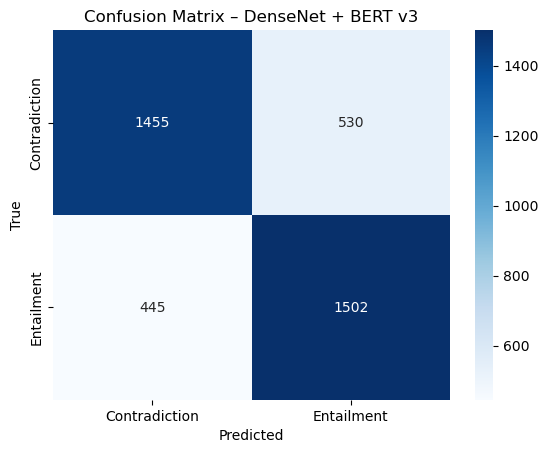

In [90]:
# --- Run predictions on the test set ---
preds = densenet_crossattn_v3.predict(test_ds, verbose=0).ravel()
pred_labels = np.where(preds > 0.5, "entailment", "contradiction")

# --- Build dataframe ---
test_df_eval = test_df.copy()
test_df_eval["Pred_Prob"] = preds
test_df_eval["Pred_Label"] = pred_labels

# --- Compute confusion matrix ---
cm = confusion_matrix(test_df_eval["Label"], test_df_eval["Pred_Label"], labels=["contradiction", "entailment"])
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Contradiction", "Entailment"], yticklabels=["Contradiction", "Entailment"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix – DenseNet + BERT v3")
plt.show()
# --- Save for later inspection ---
test_df_eval.to_csv("test_predictions_v3.csv", index=False)


The matrix shows that the model performs consistently overall:

- True Negatives (Contradiction → Contradiction): 1455  
- False Negatives (Contradiction → Entailment): 530  
- False Positives (Entailment → Contradiction): 445  
- True Positives (Entailment → Entailment): 1502  

**Observations:**
- Overall accuracy ≈ **0.75**  
- ~500 misclassifications in each direction  
- Slightly more *Contradiction* cases are misclassified as *Entailment*  
- Balanced performance, with marginally better recall for *Entailment*

Next let us randomly pick some examples from each direction are visualized below.  

Entailment→Contradiction (1→0): 445 samples
Contradiction→Entailment (0→1): 530 samples


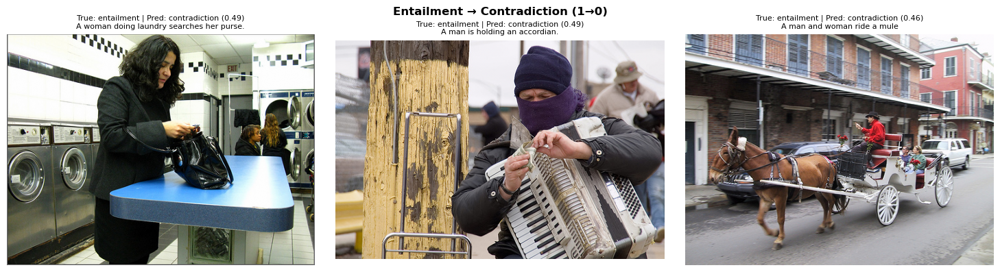

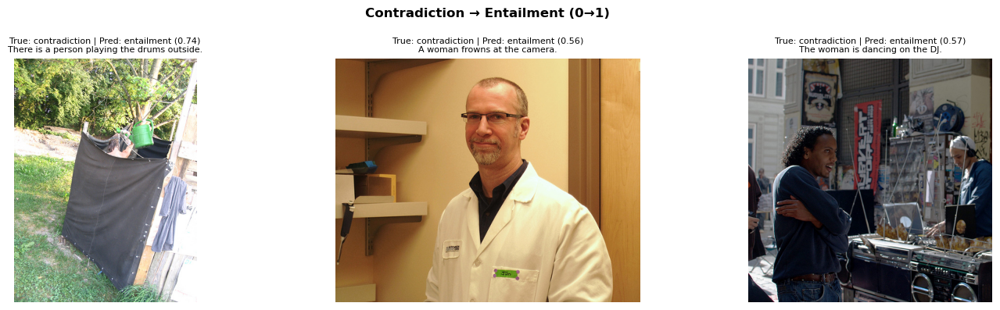

In [93]:
# --- Confusion-based Error Inspection ---

# Numeric mapping
label_map = {"contradiction": 0, "entailment": 1}
test_df_eval["True_Num"] = test_df_eval["Label"].map(label_map)
test_df_eval["Pred_Num"] = test_df_eval["Pred_Label"].map(label_map)

# Misclassification directions
ent_to_con = test_df_eval[(test_df_eval["True_Num"] == 1) & (test_df_eval["Pred_Num"] == 0)]
con_to_ent = test_df_eval[(test_df_eval["True_Num"] == 0) & (test_df_eval["Pred_Num"] == 1)]

print(f"Entailment→Contradiction (1→0): {len(ent_to_con)} samples")
print(f"Contradiction→Entailment (0→1): {len(con_to_ent)} samples")


# --- Side-by-side Misclassification Display ---
def show_error_row(df, title, n=3):
    """Display n misclassified examples in one row."""
    samples = df.sample(min(n, len(df)), random_state=99)
    fig, axes = plt.subplots(1, len(samples), figsize=(15, 4))
    fig.suptitle(title, fontsize=12, fontweight="bold")
    
    for ax, (_, row) in zip(axes, samples.iterrows()):
        img = np.array(Image.open(f"A2_data/A2_Images/{row['Image_ID']}.jpg").convert("RGB")) / 255.0
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(
            f"True: {row['Label']} | Pred: {row['Pred_Label']} ({row['Pred_Prob']:.2f})\n"
            f"{row['Hypothesis'][:80]}{'...' if len(row['Hypothesis']) > 80 else ''}",
            fontsize=8,
        )
    plt.tight_layout()
    plt.show()

# --- Display 3 samples per type ---
show_error_row(ent_to_con, "Entailment → Contradiction (1→0)", n=3)
show_error_row(con_to_ent, "Contradiction → Entailment (0→1)", n=3)

### Misclassification Insights

The examples above showed from both misclassification directions

**Entailment → Contradiction (1→0):**  
In these cases, the hypothesis correctly describes the visual scene, but our model predicts *contradiction*.  
- The first example (“a woman doing laundry searches her purse”) is aligned with the image, but the model predicted contradiction with 0.49 probability showing the low confidence on the prediction. It may be struggling with the action.    
- Similarly, in the second example model failed to link the descriptions (“man holding an accordion”), with low confidence again.
- The third one was tricky. "A man and women ride a mule" was labelled as "Entailment" while the model predicted contradiction. It is arguably correct, since the man and women are in the carriage drawn by the mule or horse. So this one is difficult even from human determination.

These examples might indicate our model is still struggled with complex scenes. 

**Contradiction → Entailment (0→1):**  
Here, the model predicts *entailment* even though the hypothesis is incorrect.  
- The “person playing the drums” scene is a clear false, however, the model might mistakenly identify "person" and "drums".  
- The “woman frowns at the camera” and “woman is dancing on the DJ” examples indicate that gender or action attributes might be hard to pick up by the model.  
Overall, these errors point out the model’s potential **difficulties** on recognising **gender, action and complex scene** as we predicted.


### 5.2 Attention and Saliency Visualisation

To further understand how our model makes decisions, we apply interpretability methods at both the image and text levels.  

For the image part, we use Grad-CAM and saliency overlays techniques to highlight spatial regions in the images:  
- **Saliency maps** show the gradient sensitivity across the entire image.  
- **Grad-CAM overlays** reveal semantically focused regions that the visual encoder considers most relevant.
For the text part,  we use token importance maps on textual attention.  
- **Token importance bars** capture how the text encoder weights different words during the reasoning process.  

We firstly set up some helper functions.

In [56]:
def plot_text_embedding_norm(bert_model, preprocessor, text):
    """
    Token importance via contextual embedding L2 norm.
    Improved normalization excluding PAD tokens.
    """
    toks = preprocessor(text)
    for k in toks:
        toks[k] = tf.convert_to_tensor(tf.expand_dims(toks[k], 0))

    outputs = bert_model(toks, training=False)
    seq_output = outputs["sequence_output"][0]
    token_norm = tf.norm(seq_output, axis=-1).numpy()

    # Convert token IDs -> strings
    tokenizer = BertTokenizer.from_preset("bert_base_en_uncased")
    token_ids = toks["token_ids"].numpy()[0]
    tokens = [tokenizer.id_to_token(int(i)) for i in token_ids]

    # Identify active tokens (not PAD)
    pad_mask = toks["padding_mask"].numpy()[0].astype(bool)
    active_norm = token_norm[pad_mask]

    # Normalize only across active tokens
    active_norm = (active_norm - active_norm.min()) / (active_norm.max() - active_norm.min() + 1e-9)

    # Fill normalized values back into full array
    norm_full = np.zeros_like(token_norm)
    norm_full[pad_mask] = active_norm

    plt.figure(figsize=(12, 1))
    plt.bar(range(len(tokens)), norm_full, color="royalblue")
    plt.xticks(range(len(tokens)), tokens, rotation=90)
    plt.title("Token Importance via Embedding Norm (Excluding PAD Normalization)")
    plt.show()

In [70]:
def get_image_saliency(model, features, target_label=0, gamma=0.5):
    """
    Compute visually enhanced saliency map for the image input.
    - model: multimodal model
    - features: input dict
    - target_label: 0 for entailment, 1 for contradiction
    - gamma: <1 brightens contrast (default 0.5)
    """
    img = features["image"]

    with tf.GradientTape() as tape:
        tape.watch(img)
        preds = model(features, training=False)
        score = preds[:, target_label]

    grads = tape.gradient(score, img)
    if grads is None:
        raise ValueError("Gradients could not be computed. Check input tensors.")

    # Aggregate across RGB channels
    sal = tf.reduce_mean(tf.abs(grads), axis=-1)[0].numpy()

    # Normalize 0–1
    sal = (sal - sal.min()) / (sal.max() - sal.min() + 1e-9)

    # Apply gamma correction (brightens high-value regions)
    sal = np.power(sal, gamma)

    # Resize to full image size (H, W)
    h, w = img.shape[1:3]
    sal = cv2.resize(sal, (w, h), interpolation=cv2.INTER_CUBIC)

    # Optional light Gaussian smoothing
    sal = cv2.GaussianBlur(sal, (7, 7), 0)
    return sal


def get_gradcam(model, img_tensor, features, target_label=0, last_conv_layer_name="conv5_block16_concat"):
    """
    Compute Grad-CAM heatmap for DenseNet inside multimodal model.
    Returns normalized (0–1) heatmap resized to image size.
    """
    # Locate CNN backbone
    cnn_layers = [l for l in model.layers if "densenet" in l.name.lower()]
    if not cnn_layers:
        raise ValueError("No DenseNet backbone found in the model.")
    cnn = cnn_layers[0]

    grad_model = tf.keras.Model(
        inputs=cnn.input,
        outputs=[cnn.get_layer(last_conv_layer_name).output, cnn.output]
    )

    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(img_tensor)
        loss = preds[:, target_label]

    grads = tape.gradient(loss, conv_out)
    if grads is None:
        raise ValueError("Gradients could not be computed. Check input shapes.")

    # Compute channel importance weights
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out = conv_out[0]
    heatmap = tf.reduce_sum(conv_out * pooled_grads, axis=-1).numpy()

    # ReLU + normalization
    heatmap = np.maximum(heatmap, 0)
    heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap) + 1e-9)

    # Resize to match image dimensions
    img_h, img_w = img_tensor.shape[1:3]
    heatmap = cv2.resize(heatmap, (img_w, img_h), interpolation=cv2.INTER_CUBIC)

    # Smooth and re-normalize
    heatmap = cv2.GaussianBlur(heatmap, (11, 11), 0)
    heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap) + 1e-9)
    return heatmap


Then, we randomly pick two samples to display.

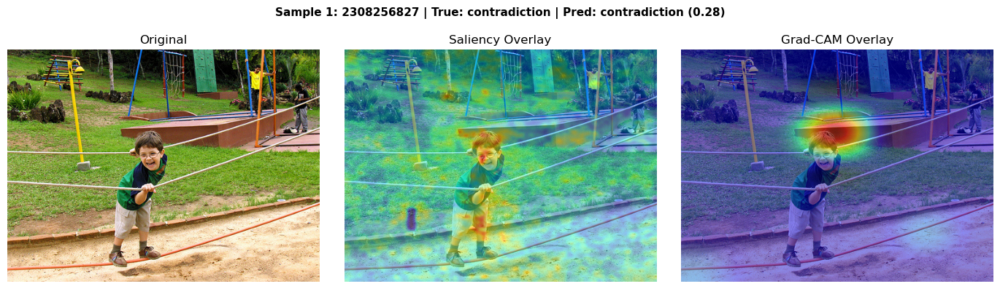


Hypothesis: The girl tries on the blue dress at the store.


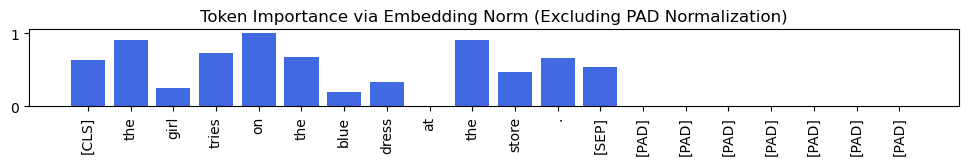

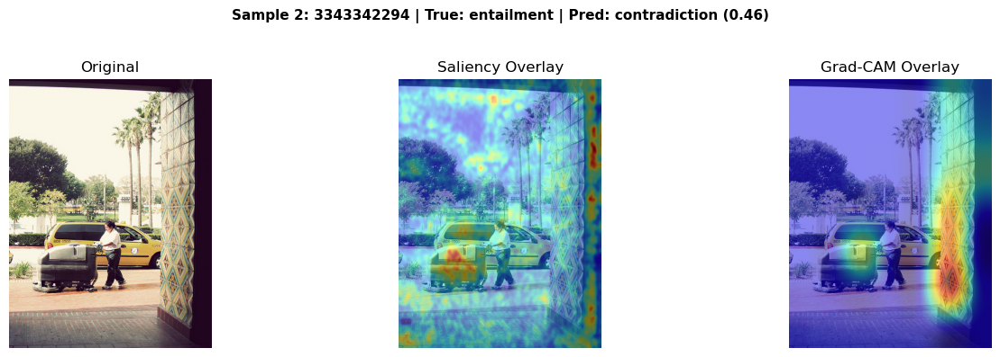


Hypothesis: A woman is walking in front of a taxi.


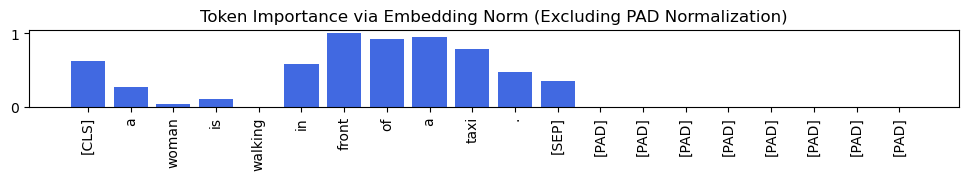

In [83]:
densenet_crossattn_v3.load_weights("best_densenet_crossattn_v3.weights.h5")

sample_rows = test_df.sample(2, random_state=189).reset_index(drop=True)

for i, row in sample_rows.iterrows():
    img_id = row["Image_ID"]
    hypothesis = row["Hypothesis"]
    true_label = row["Label"]

    # --- Prepare ---
    img_tensor = tf.expand_dims(load_image(tf.constant(img_id)), 0)
    tok = preprocessor(hypothesis)
    features = {
        "image": img_tensor,
        "token_ids": tf.expand_dims(tok["token_ids"], 0),
        "segment_ids": tf.expand_dims(tok["segment_ids"], 0),
        "padding_mask": tf.expand_dims(tok["padding_mask"], 0)
    }

    pred_prob = densenet_crossattn_v3.predict(features, verbose=0)[0][0]
    pred_label = "entailment" if pred_prob > 0.5 else "contradiction"

    # --- Compute maps ---
    sal = get_image_saliency(densenet_crossattn_v3, features)
    cam = get_gradcam(densenet_crossattn_v3, img_tensor, features)
    orig = np.array(Image.open(f"A2_data/A2_Images/{img_id}.jpg").convert("RGB")) / 255.0

    # --- Resize overlays for perfect alignment ---
    img_h, img_w = orig.shape[:2]
    sal_resized = cv2.resize(sal, (img_w, img_h), interpolation=cv2.INTER_CUBIC)
    cam_resized = cv2.resize(cam, (img_w, img_h), interpolation=cv2.INTER_CUBIC)

    # --- Visual grid ---
    fig, axs = plt.subplots(1, 3, figsize=(14, 4))
    fig.suptitle(
        f"Sample {i+1}: {img_id} | True: {true_label} | Pred: {pred_label} ({pred_prob:.2f})",
        fontsize=11, fontweight="bold"
    )

    axs[0].imshow(orig)
    axs[0].set_title("Original")
    axs[0].axis("off")

    axs[1].imshow(orig)
    axs[1].imshow(sal_resized, cmap="jet", alpha=0.45)
    axs[1].set_title("Saliency Overlay")
    axs[1].axis("off")

    axs[2].imshow(orig)
    axs[2].imshow(cam_resized, cmap="jet", alpha=0.45)
    axs[2].set_title("Grad-CAM Overlay")
    axs[2].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # --- Hypothesis and text importance ---
    print(f"\nHypothesis: {hypothesis}")
    plot_text_embedding_norm(bert, preprocessor, hypothesis)


**Sample 1 – True: Contradiction | Predicted: Contradiction (Confidence: 0.28)**  
The model correctly classified this example as a contradiction.  
- **Visual reasoning:**  
  Both the saliency and Grad-CAM overlays focus on the **child’s face and upper body**, confirming that the model detected the main subject.  
  However, the model might miss the dressing and environment (outdoors) which will be contradicted to the text description. 
- **Text reasoning:**  
  Words like *“tries”*, *“girl”*, *“store”*, and *“blue”* have fairly attentions given.   
  Overall, this case indicates the model attends to the main image subject and textual contents.

---

**Sample 2 – True: Entailment | Predicted: Contradiction (Confidence: 0.46)**  
This is a misclassification with low confidence.  
- **Visual reasoning:**  
  Grad-CAM activation is on the **machine** and the **wall**, while the person walking receives weak attention.  
  The model seems distracted by background texture rather than focusing on the *woman* and *taxi*.  
- **Text reasoning:**  
  The most important tokens are *“in front”* and *“taxi”*. This might explain the model predicted "Contradicion", since the image part and text part were focusing on different things. 

---

**Summary:**  
These two cases provided us a glimpse of how the model works, though it might not be the case. However, we can still gain some insights that the model is able to pick up main subjects but could fail in complexed settings.


## 5.3 Representation Visualisation with t-SNE

After analysing the individual predictions, we now analyse how the model organises multimodal features in its internal representation space.

we use **t-distributed Stochastic Neighbor Embedding (t-SNE)** to project the high-dimensional embeddings from the model’s penultimate layer into two dimensions for visualisation.  

The process is:

- *Extract embeddings*: Build a sub-model ending at the penultimate layer to get 1-D feature vectors for every image–text pair.

- *Encode inputs*: For each test record, load image and tokenise text, then run a forward pass to obtain its embedding.

- *Dimensionality reduction*: Apply PCA (≈50 components) to compress features for faster processing, then t-SNE to map them into 2-D space.

- *Plot*: Scatter plot coloured by true labels to visually inspect how well entailment and contradiction clusters are separated.


Extracted embeddings: (3932, 256), labels: (3932,)


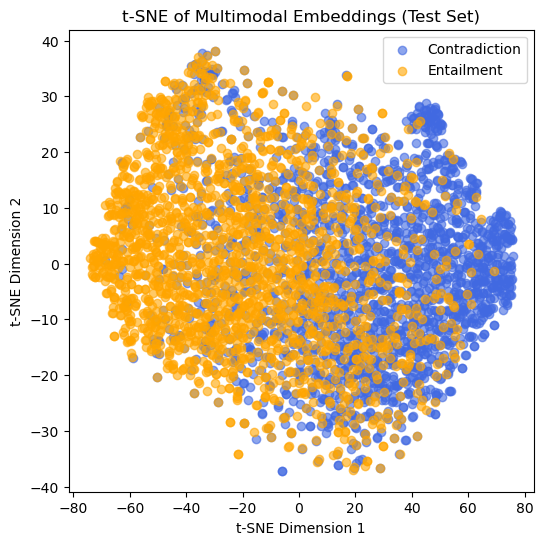

In [85]:
# --- Extract embeddings ---
extract_model = tf.keras.Model(
    inputs=densenet_crossattn_v3.input,
    outputs=densenet_crossattn_v3.layers[-2].output
)

embeddings = []
labels = []

for i, row in test_df.iterrows():
    img_id = row["Image_ID"]
    hypothesis = row["Hypothesis"]
    label = row["Label"]

    img_tensor = tf.expand_dims(load_image(tf.constant(img_id)), 0)
    tok = preprocessor(hypothesis)
    features = {
        "image": img_tensor,
        "token_ids": tf.expand_dims(tok["token_ids"], 0),
        "segment_ids": tf.expand_dims(tok["segment_ids"], 0),
        "padding_mask": tf.expand_dims(tok["padding_mask"], 0)
    }

    emb = extract_model.predict(features, verbose=0)
    embeddings.append(emb[0])
    labels.append(1 if label == "entailment" else 0)

embeddings = np.array(embeddings)
labels = np.array(labels)

print(f"Extracted embeddings: {embeddings.shape}, labels: {labels.shape}")

# --- PCA for speed ---
pca_emb = PCA(n_components=min(50, embeddings.shape[1])).fit_transform(embeddings)

# --- Apply t-SNE (fixed parameter) ---
tsne = TSNE(n_components=2, perplexity=30, random_state=110, max_iter=1000)
tsne_emb = tsne.fit_transform(pca_emb)

# --- Plot ---
plt.figure(figsize=(6,6))
plt.scatter(tsne_emb[labels==0,0], tsne_emb[labels==0,1],
            c="royalblue", label="Contradiction", alpha=0.6)
plt.scatter(tsne_emb[labels==1,0], tsne_emb[labels==1,1],
            c="orange", label="Entailment", alpha=0.6)
plt.legend()
plt.title("t-SNE of Multimodal Embeddings (Test Set)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


The t-SNE plot shows moderate cluster overlap — the classes are partly separable but not cleanly split. This is consistent with ≈ 0.75 accuracy and confirms that the model learned partial differentiation between entailment and contradiction, but embeddings remain entangled. 

# 6. Prediction on Submission Data
In this final step, we use our model (v3) to predict the unseen submission dataset. We will keep the same five-view Test-Time Augmentation (TTA) — including original, flipped, rotated, brightness-adjusted, and contrast-adjusted views. The averaged probabilities from these augmented versions will be the final predictions.

In [23]:
# --- Load best weights ---
densenet_crossattn_v3.load_weights("best_densenet_crossattn_v3.weights.h5")

# --- Load test JSONL ---
IMG_DIR = "A2_test_Images"
test_file = "A2_test_v3_final.jsonl"
records = [json.loads(line) for line in open(test_file, "r")]
test_final_df = pd.DataFrame(records, columns=["Image_ID", "Hypothesis"])
print("Total samples:", len(test_final_df))

# --- Build unlabeled dataset ---
def make_example_final(image_id, text):
    img = load_image(image_id)
    toks = preprocessor(text)
    features = {
        "image": tf.cast(img, tf.float32),
        "token_ids": tf.cast(toks["token_ids"], tf.int32),
        "segment_ids": tf.cast(toks["segment_ids"], tf.int32),
        "padding_mask": tf.cast(toks["padding_mask"], tf.int32)
    }
    return features

def make_dataset_final(df, batch_size=32):
    ds = tf.data.Dataset.from_tensor_slices((df["Image_ID"].values, df["Hypothesis"].values))
    ds = ds.map(lambda img_id, hypo: make_example_final(img_id, hypo),
                num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

test_final_ds = make_dataset_final(test_final_df)

# --- Augmentation modes for TTA ---
def apply_aug(features, mode):
    img = features["image"]
    if mode == "flip":
        img = tf.image.flip_left_right(img)
    elif mode == "rotate":
        img = tf.image.rot90(img)
    elif mode == "bright":
        img = tf.image.adjust_brightness(img, 0.1)
    elif mode == "contrast":
        img = tf.image.adjust_contrast(img, 1.2)
    return {**features, "image": img}

# --- Multi-view TTA prediction (5 augmentations) ---
def predict_tta_batch(model, ds):
    modes = ["orig", "flip", "rotate", "bright", "contrast"]
    preds = []
    for mode in modes:
        if mode == "orig":
            ds_aug = ds
        else:
            ds_aug = ds.map(lambda f, m=mode: apply_aug(f, m),
                            num_parallel_calls=tf.data.AUTOTUNE)
        p = model.predict(ds_aug, verbose=1)
        preds.append(p)
    return np.mean(preds, axis=0)

# --- Predict ---
probs = predict_tta_batch(densenet_crossattn_v3, test_final_ds)
labels = np.where(probs > 0.5, "entailment", "contradiction")

# --- Save submission ---
submission_df = test_final_df.copy()
submission_df["Label"] = labels
submission_df["Image_ID"] = submission_df["Image_ID"].astype(str) + ".jpg"
submission_df.to_csv("predictions.csv", index=False)

Total samples: 11937
374/374 [==============================] - 58s 154ms/step


# 7. Conclusion
In this project, we developed an end-to-end multimodal deep learning system for visual-textual entailment task. We used a DenseNet–BERT architecture enhanced with cross-attention fusion and partial fine-tuning. The final model (v3) achieved around **75%** test accuracy, as well as balanced performance across entailment and contradiction classes. This surpasses our set goal **70%**.
 
Analysis through confusion matrices, interpretability maps, and t-SNE visualisation showed that the model could align visual and textual information in some cases, but still struggled with detailed information (gender), actions and complex scenes. Test-Time Augmentation at the end further improved stability without overfitting.

In fact, we have been trying to push the performance even further. However, it seems we have hit the ceiling using CNN + BERT architecture after exhausting different techniques and methods. We believe the size of the data played a part as well as the complexity of this task.

Future work could explore larger multimodal backbones (e.g., CLIP, ViLT), expanded datasets, or contrastive pretraining to strengthen visual–text alignment.